In [1]:
!pwd

/tf


In [2]:
import matplotlib.pyplot as plt
import cv2
import glob,os
from sklearn.utils import shuffle

In [3]:
path_image = '/data/PAIP/*/patches/image'
path_mask = '/data/PAIP/*/patches/mask'

In [14]:
img = sorted(glob.glob(path_image + '/*.png'))
msk_p2 = sorted(glob.glob(path_mask + '/*_p2.png'))
msk_p3 = sorted(glob.glob(path_mask + '/*_p3.png'))
msk_p1 = sorted(glob.glob(path_mask + '/*_p1.png'))
msk_p4 = sorted(glob.glob(path_mask + '/*_p4.png'))
msk_p5 = sorted(glob.glob(path_mask + '/*_p5.png'))
img    = shuffle(img,random_state=311)
msk_p2 = shuffle(msk_p2,random_state=311)
msk_p3 = shuffle(msk_p3,random_state=311)
msk_p1 = shuffle(msk_p1,random_state=311)
msk_p4 = shuffle(msk_p4,random_state=311)
msk_p5 = shuffle(msk_p5,random_state=311)

In [15]:
print(f'Patch :{len(img)} Mask1 : {len(msk_p1)} Mask2 : {len(msk_p2)} Mask3 : {len(msk_p3)} Mask4 : {len(msk_p4)} Mask5 : {len(msk_p5)}')

Patch :13949 Mask1 : 617 Mask2 : 7 Mask3 : 5904 Mask4 : 7421 Mask5 : 0


In [17]:
print(msk_p2[0:3])
print(msk_p3[0:3])

['/data/PAIP/023/patches/mask/102_p2.png', '/data/PAIP/023/patches/mask/103_p2.png', '/data/PAIP/027/patches/mask/244_p2.png']
['/data/PAIP/012/patches/mask/185_p3.png', '/data/PAIP/044/patches/mask/140_p3.png', '/data/PAIP/007/patches/mask/215_p3.png']


In [16]:
img_p1 = []
img_p2 = []
img_p3 = []
img_p4 = []
img_p5 = []

for i in range(len(msk_p1)):
    try:

        base = msk_p1[i].split('/')[:-2]
        no= msk_p1[i].split('/')[-1].replace('_p1.png','')
        img_path = '/'.join(base) + "/image/" + no + '.png' 
        img_p1.append(img_path)
    except:
        print(i)

for i in range(len(msk_p2)):
    try:

        base = msk_p2[i].split('/')[:-2]
        no= msk_p2[i].split('/')[-1].replace('_p2.png','')
        img_path = '/'.join(base) + "/image/" + no + '.png' 
        img_p2.append(img_path)
    except:
        print(i)

for i in range(len(msk_p3)):
    try:

        base = msk_p3[i].split('/')[:-2]
        no= msk_p3[i].split('/')[-1].replace('_p3.png','')
        img_path = '/'.join(base) + "/image/" + no + '.png' 
        img_p3.append(img_path)
    except:
        print(i)
        
for i in range(len(msk_p4)):
    try:

        base = msk_p4[i].split('/')[:-2]
        no= msk_p4[i].split('/')[-1].replace('_p4.png','')
        img_path = '/'.join(base) + "/image/" + no + '.png' 
        img_p4.append(img_path)
    except:
        print(i)
    
for i in range(len(msk_p5)):
    try:
        base = msk_p5[i].split('/')[:-2]
        no= msk_p5[i].split('/')[-1].replace('_p5.png','')
        img_path = '/'.join(base) + "/image/" + no + '.png' 
        img_p5.append(img_path)
    except Exception as e:
        print(i,e)

In [18]:
img_p3[0:3]

['/data/PAIP/012/patches/image/185.png',
 '/data/PAIP/044/patches/image/140.png',
 '/data/PAIP/007/patches/image/215.png']

In [19]:
for i in range(3):
    print(img_p2[i],msk_p2[i])

/data/PAIP/023/patches/image/102.png /data/PAIP/023/patches/mask/102_p2.png
/data/PAIP/023/patches/image/103.png /data/PAIP/023/patches/mask/103_p2.png
/data/PAIP/027/patches/image/244.png /data/PAIP/027/patches/mask/244_p2.png


In [20]:
print(len(msk_p2), len(img_p2))
print(len(msk_p3), len(img_p3))

7 7
5904 5904


### VIS PERINEURAL INVASION

/home/centos/jupyter/pathology/data/patch/sample/col/0001/image/80.png /home/centos/jupyter/pathology/data/patch/sample/col/0001/mask/80_p5.png
/home/centos/jupyter/pathology/data/patch/sample/col/0001/image/82.png /home/centos/jupyter/pathology/data/patch/sample/col/0001/mask/82_p5.png
/home/centos/jupyter/pathology/data/patch/sample/col/0001/image/89.png /home/centos/jupyter/pathology/data/patch/sample/col/0001/mask/89_p5.png
/home/centos/jupyter/pathology/data/patch/sample/col/0001/image/79.png /home/centos/jupyter/pathology/data/patch/sample/col/0001/mask/79_p5.png
/home/centos/jupyter/pathology/data/patch/sample/col/0001/image/67.png /home/centos/jupyter/pathology/data/patch/sample/col/0001/mask/67_p5.png
/home/centos/jupyter/pathology/data/patch/sample/col/0001/image/78.png /home/centos/jupyter/pathology/data/patch/sample/col/0001/mask/78_p5.png
/home/centos/jupyter/pathology/data/patch/sample/col/0001/image/85.png /home/centos/jupyter/pathology/data/patch/sample/col/0001/mask/85

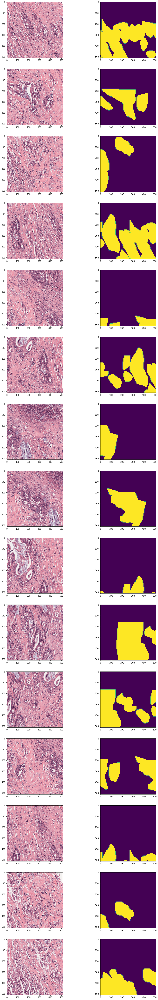

In [24]:
plt.figure(figsize=(15, 6*60))
for i, (img_name, msk_name) in enumerate(zip(img_p5[:15], msk_p5[:15])):
    img = cv2.imread(img_name, 1)
    msk = cv2.imread(msk_name, 0)
    print(img_name, msk_name)
    plt.subplot(60,2, 2*i+1)
    plt.imshow(img)
    plt.subplot(60,2, 2*i+2)
    plt.imshow(msk)
    
    

/data/PAIP/023/patches/image/102.png /data/PAIP/023/patches/mask/102_p2.png
/data/PAIP/023/patches/image/103.png /data/PAIP/023/patches/mask/103_p2.png
/data/PAIP/027/patches/image/244.png /data/PAIP/027/patches/mask/244_p2.png
/data/PAIP/023/patches/image/101.png /data/PAIP/023/patches/mask/101_p2.png
/data/PAIP/027/patches/image/243.png /data/PAIP/027/patches/mask/243_p2.png


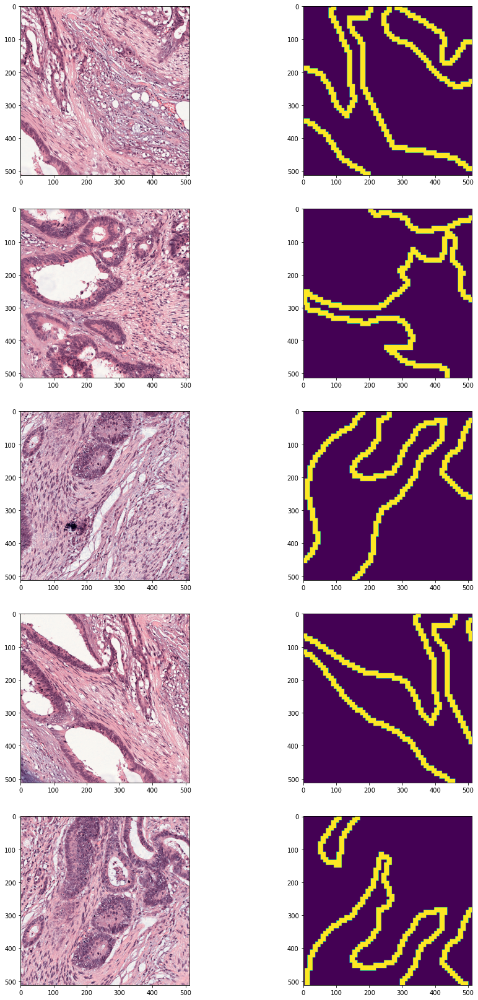

In [21]:
plt.figure(figsize=(15, 6*60))
for i, (img_name, msk_name) in enumerate(zip(img_p2[:5], msk_p2[:5])):
    img = cv2.imread(img_name, 1)
    msk = cv2.imread(msk_name, 0)
    print(img_name, msk_name)
    plt.subplot(60,2, 2*i+1)
    plt.imshow(img)
    plt.subplot(60,2, 2*i+2)
    plt.imshow(msk)
    
    

/home/centos/jupyter/pathology/patch_global/col/0017/image/121.png /home/centos/jupyter/pathology/patch_global/col/0017/mask/121_p2.png
/home/centos/jupyter/pathology/patch_global/col/0017/image/122.png /home/centos/jupyter/pathology/patch_global/col/0017/mask/122_p2.png
/home/centos/jupyter/pathology/patch_global/col/0017/image/123.png /home/centos/jupyter/pathology/patch_global/col/0017/mask/123_p2.png
/home/centos/jupyter/pathology/patch_global/col/0017/image/124.png /home/centos/jupyter/pathology/patch_global/col/0017/mask/124_p2.png
/home/centos/jupyter/pathology/patch_global/col/0017/image/125.png /home/centos/jupyter/pathology/patch_global/col/0017/mask/125_p2.png
/home/centos/jupyter/pathology/patch_global/col/0017/image/126.png /home/centos/jupyter/pathology/patch_global/col/0017/mask/126_p2.png
/home/centos/jupyter/pathology/patch_global/col/0017/image/127.png /home/centos/jupyter/pathology/patch_global/col/0017/mask/127_p2.png
/home/centos/jupyter/pathology/patch_global/col/

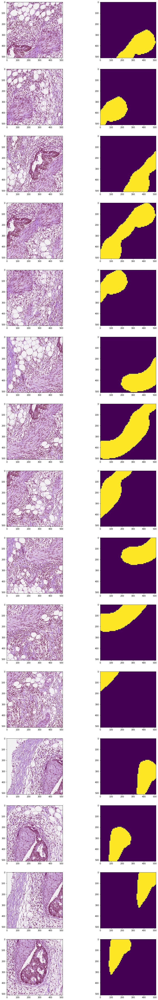

In [200]:
plt.figure(figsize=(15, 6*60))
for i, (img_name, msk_name) in enumerate(zip(img_p2[:15], msk_p2[:15])):
    img = cv2.imread(img_name, 1)
    msk = cv2.imread(msk_name, 0)
    print(img_name, msk_name)
    plt.subplot(60,2, 2*i+1)
    plt.imshow(img)
    plt.subplot(60,2, 2*i+2)
    plt.imshow(msk)
    
    

### VIS NERVE WITHOUT TUMOR

/data/PAIP/039/patches/image/263.png /data/PAIP/039/patches/mask/263_p1.png
/data/PAIP/028/patches/image/101.png /data/PAIP/028/patches/mask/101_p1.png
/data/PAIP/044/patches/image/232.png /data/PAIP/044/patches/mask/232_p1.png
/data/PAIP/018/patches/image/366.png /data/PAIP/018/patches/mask/366_p1.png
/data/PAIP/036/patches/image/82.png /data/PAIP/036/patches/mask/82_p1.png
/data/PAIP/034/patches/image/43.png /data/PAIP/034/patches/mask/43_p1.png
/data/PAIP/050/patches/image/98.png /data/PAIP/050/patches/mask/98_p1.png
/data/PAIP/050/patches/image/79.png /data/PAIP/050/patches/mask/79_p1.png
/data/PAIP/002/patches/image/59.png /data/PAIP/002/patches/mask/59_p1.png
/data/PAIP/024/patches/image/352.png /data/PAIP/024/patches/mask/352_p1.png
/data/PAIP/048/patches/image/123.png /data/PAIP/048/patches/mask/123_p1.png
/data/PAIP/049/patches/image/103.png /data/PAIP/049/patches/mask/103_p1.png
/data/PAIP/024/patches/image/339.png /data/PAIP/024/patches/mask/339_p1.png
/data/PAIP/032/patches

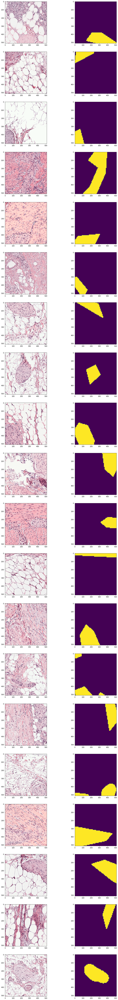

In [22]:
plt.figure(figsize=(15, 6*60))
for i, (img_name, msk_name) in enumerate(zip(img_p1[-20:], msk_p1[-20:])):
    img = cv2.imread(img_name, 1)
    msk = cv2.imread(msk_name, 0)
    print(img_name, msk_name)
    plt.subplot(60,2, 2*i+1)
    plt.imshow(img)
    plt.subplot(60,2, 2*i+2)
    plt.imshow(msk)
    
    

### VIS TUMOR WITHOUT NERVE

/home/centos/jupyter/pathology/patch_overlap_global_512_stain/col/0047/image/300.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/col/0047/mask/300_p3.png
/home/centos/jupyter/pathology/patch_overlap_global_512_stain/col/0013/image/222.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/col/0013/mask/222_p3.png
/home/centos/jupyter/pathology/patch_overlap_global_512_stain/col/0016/image/48.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/col/0016/mask/48_p3.png
/home/centos/jupyter/pathology/patch_overlap_global_512_stain/pros/0016/image/637.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/pros/0016/mask/637_p3.png
/home/centos/jupyter/pathology/patch_overlap_global_512_stain/pan/0035/image/173.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/pan/0035/mask/173_p3.png


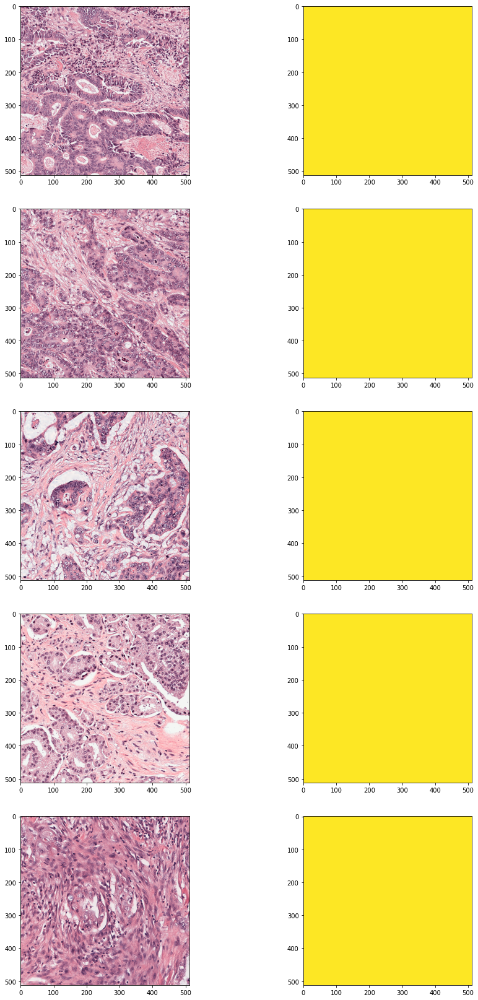

In [30]:
plt.figure(figsize=(15, 6*60))
for i, (img_name, msk_name) in enumerate(zip(img_p3[:5], msk_p3[:5])):
    img = cv2.imread(img_name, 1)
    msk = cv2.imread(msk_name, 0)
    print(img_name, msk_name)
    plt.subplot(60,2, 2*i+1)
    plt.imshow(img)
    plt.subplot(60,2, 2*i+2)
    plt.imshow(msk,vmin=0,vmax=1)
    
    

### VIS NONTUMOR WITHOUT NERVE

/home/centos/jupyter/pathology/patch_overlap_global_512_stain/pan/0010/image/200.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/pan/0010/mask/200_p4.png
/home/centos/jupyter/pathology/patch_overlap_global_512_stain/pros/0035/image/339.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/pros/0035/mask/339_p4.png
/home/centos/jupyter/pathology/patch_overlap_global_512_stain/pan/0018/image/94.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/pan/0018/mask/94_p4.png
/home/centos/jupyter/pathology/patch_overlap_global_512_stain/pan/0039/image/683.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/pan/0039/mask/683_p4.png
/home/centos/jupyter/pathology/patch_overlap_global_512_stain/col/0010/image/223.png /home/centos/jupyter/pathology/patch_overlap_global_512_stain/col/0010/mask/223_p4.png
/home/centos/jupyter/pathology/patch_overlap_global_512_stain/pan/0031/image/185.png /home/centos/jupyter/pathology/patch_overlap_global_512

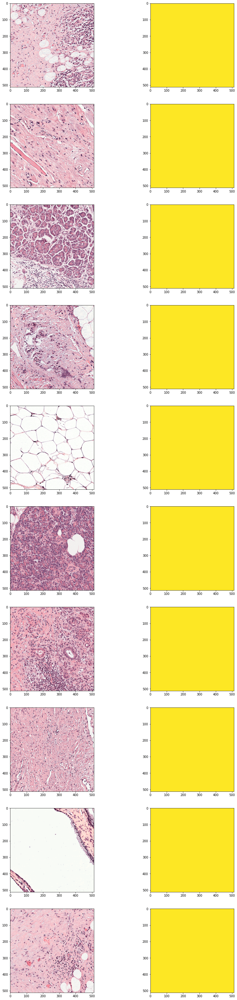

In [31]:
plt.figure(figsize=(15, 6*60))
for i, (img_name, msk_name) in enumerate(zip(img_p4[-10:], msk_p4[-10:])):
    img = cv2.imread(img_name, 1)
    msk = cv2.imread(msk_name, 0)
    print(img_name, msk_name)
    plt.subplot(60,2, 2*i+1)
    plt.imshow(img)
    plt.subplot(60,2, 2*i+2)
    plt.imshow(msk,vmin=0,vmax=1)
    
    